### Quizás este archivo sea eliminado en el futuro :"inserte emoji del fantasma de whatsapp"

In [ ]:
pip install Pillow matplotlib

In [12]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import pandas as pd
import ast

In [3]:
# Muy ligera    1.2
# Ligera        1.375
# Moderada      1.55
# Activa        1.725
# Muy Activa    1.9
# Factor de actividad fisica mifflin
def factorDeActividad(factor):
    factores = {
        1: 1.2,
        2: 1.375,
        3: 1.55,
        4: 1.725
    }
    return factores.get(factor, 1.9)

# Requiere: peso   = float (kg)
#           altura = int (cm)
#           edad   = int
#           sexo   = char ('m' or 'f')
#           factor = {1-5} 1 muy poca, 5 mucha
# BMR mifflin
def necesidadCaloricaReposo(peso, altura, edad, sexo, actividad):
    factor = factorDeActividad(actividad)
    if sexo != 'f':
        return (10 * peso + 6.25 * altura - 5 * edad + 5) * factor
    else:
        return (10 * peso + 6.25 * altura - 5 * edad - 161) * factor


# a ver este lo dice deepseek aunque no paso base cientifica,
# de no querer usarlo, llamar a necesidadCaloricaReposo()
# Pérdida: Resta 500 kcal/día (aprox. -0.5 kg/semana).
# Mantenimiento: Usa el valor calculado.
# Ganancia: Añade 500 kcal/día.

# perdida = 2 normal
# perdida = 1 ganancia
# perdida = 0 bajar peso 
def objetivo(peso, altura, edad, sexo, actividad, perdida = 2):
    mifflin = necesidadCaloricaReposo(peso, altura, edad, sexo, actividad)
    objetivos = {
        0: -500,
        1: 500,
    }
    return objetivos.get(perdida, 0) + mifflin

In [ ]:
# esperemos que luego andres quiera hacer una interfaz grafica para asi que quede más presentable tanto la entrada como la salida
# será que le pedimos su nombre? XD

while True:
    try:
        edad = int(input("Su edad: "))
        peso = float(input("Su peso (kg): "))
        altura = int(input("Su altura (cm): "))
        sexo = str(input("Sexo (m,f o \"no se, nunca he tenido\"): "))
        if sexo not in ['m', 'f', 'no se, nunca he tenido']:
            print("Por favor, ingrese 'm', 'f' o 'no se, nunca he tenido'.")
            continue
        actividad = int(input("Su actividad física en un intervalo {1-5}\n"
                           "1) Muy ligera\n"
                           "2) ligera\n"
                           "3) moderada\n"
                           "4) activ@\n"
                           "5) Muy activ@\n"))
        if actividad not in [1, 2, 3, 4, 5]:
            print("Por favor, ingrese un número entre 1 y 5.")
            continue
        obj = int(input("mantener, ganar o perder peso? (0/1/2): "))
        if obj not in [0, 1, 2]:
            print("Por favor, ingrese 0, 1 o 2.")
            continue
        calorias = objetivo(peso, altura, edad, sexo, actividad, obj)
        break 
    except ValueError:
        print("Error: Ingrese valores válidos.")
    except Exception as e:
        print(f"Error inesperado: {e}")
        continue
print(f"calorías necesarias: {calorias}")

### Salida

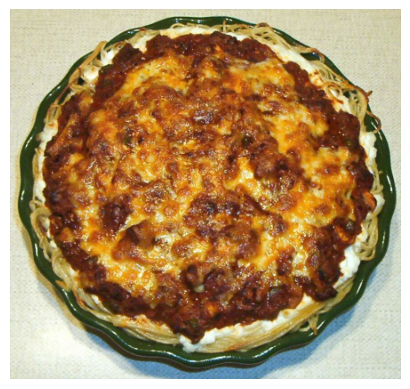

In [ ]:
# Enlace de la imagen
url = 'https://img.sndimg.com/food/image/upload/w_555,h_416,c_fit,fl_progressive,q_95/v1/img/recipes/11/19/picDSGoCF.jpg'

# Descargar la imagen
response = requests.get(url)
img = Image.open(BytesIO(response.content))

# Mostrar la imagen
plt.imshow(img)
plt.axis('off')  # Ocultar los ejes
plt.show()

In [33]:
data = pd.read_csv('../dataset/recipes_procesado2.csv')

In [36]:
# arregla bien el enlace
def corregir_links(links):
    if links.startswith("c("):
        links = links[2:-1]
    links = links.replace('"', '')
    links = links.replace("'", '')
    links = links.replace("[", '')
    links = links.replace("]", '')
    links = links.split(', ')
    # a veces vienen enlaces con regalitos antes del https por lo que hay que eliminar eso
    #links = [corregir_link(link) for link in links]
    return links
    


Carrot Cake


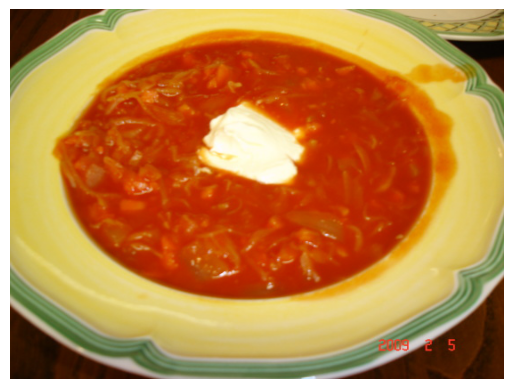

In [59]:
# para hacerlo a todas las imagenes del dataset

#tal parece que siempre se debe corregir los links de la columna en la que estamos porque cuando se guarda en el dataset siempre hay un problema que fastidio
links = corregir_links(data['Images'].iloc[4])

try:
    for link in links:
        if link == "character(0)":
            print('Error al cargar las imagenes\n')
            break
        response = requests.get(link)
        img = Image.open(BytesIO(response.content))
        # Mostrar la imagen
        print(data.iloc[i]['Name'])
        plt.imshow(img)
        plt.axis('off')  # Ocultar los ejes
        plt.show()
except:
    print('Error al cargar las imagenes\n')



Low-Fat Berry Blue Frozen Dessert


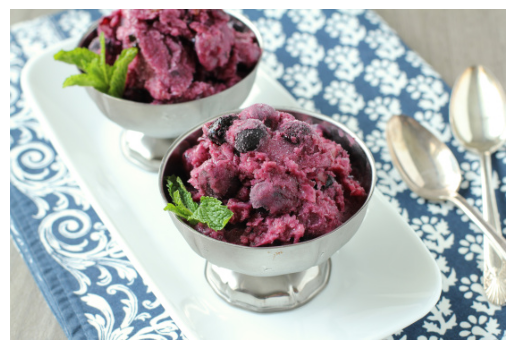

Low-Fat Berry Blue Frozen Dessert


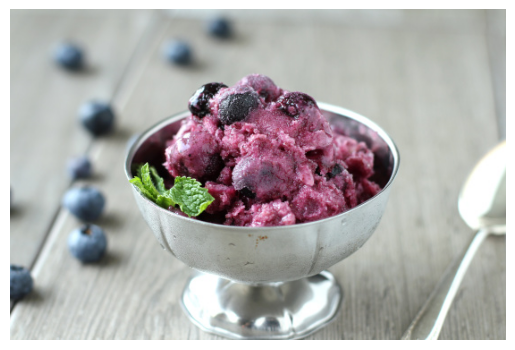

Low-Fat Berry Blue Frozen Dessert


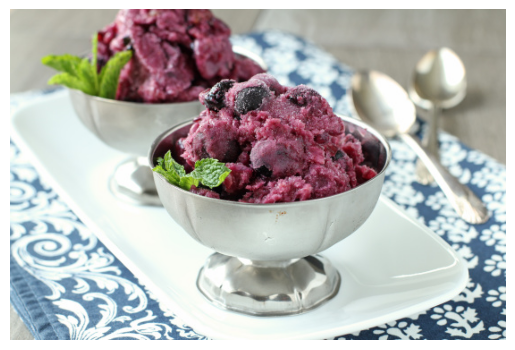

Low-Fat Berry Blue Frozen Dessert


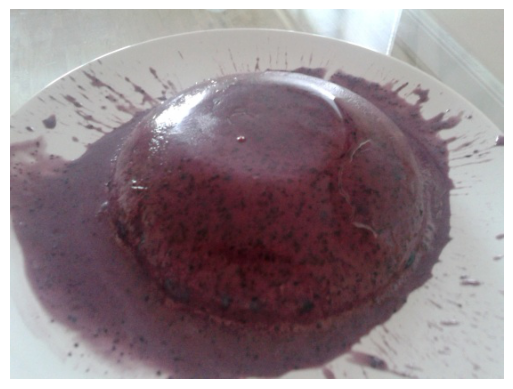

Low-Fat Berry Blue Frozen Dessert


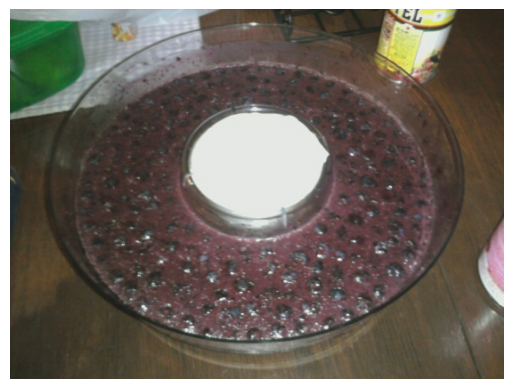

Low-Fat Berry Blue Frozen Dessert


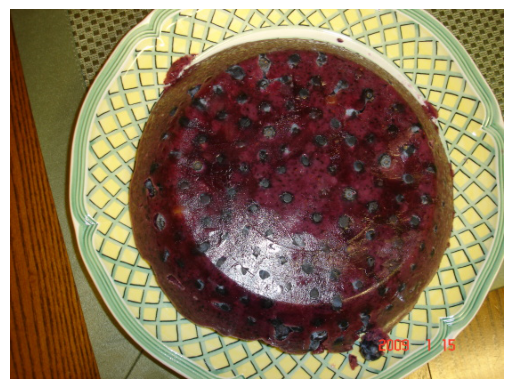

Biryani


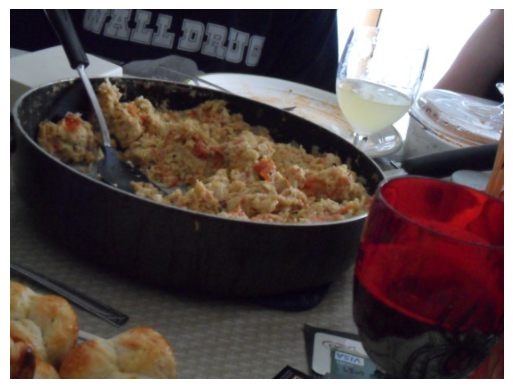

Biryani


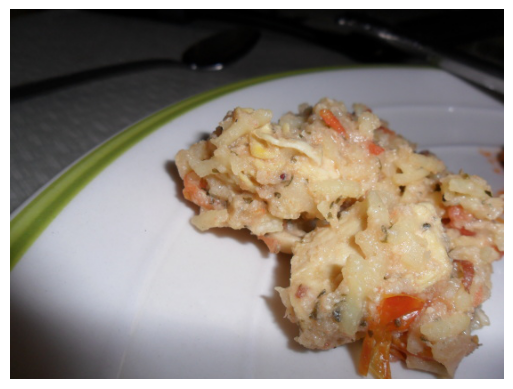

Best Lemonade


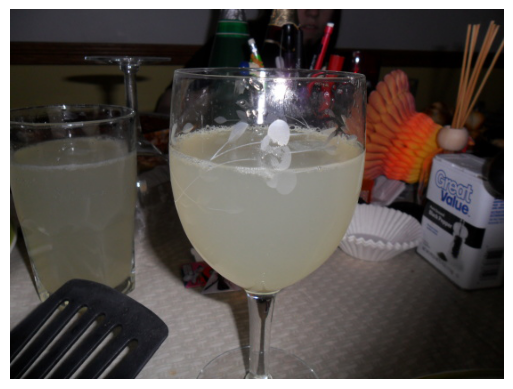

Best Lemonade


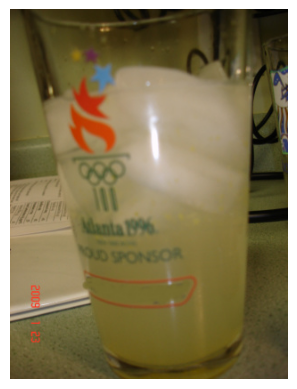

Carina's Tofu-Vegetable Kebabs


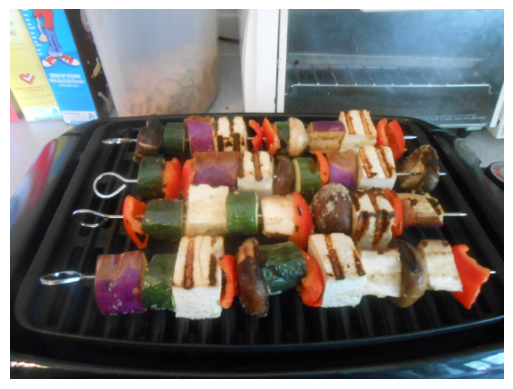

Carina's Tofu-Vegetable Kebabs


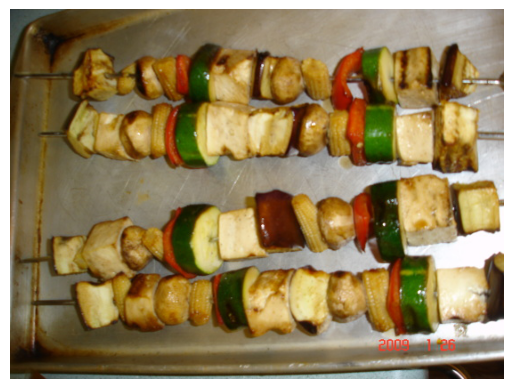

Cabbage Soup


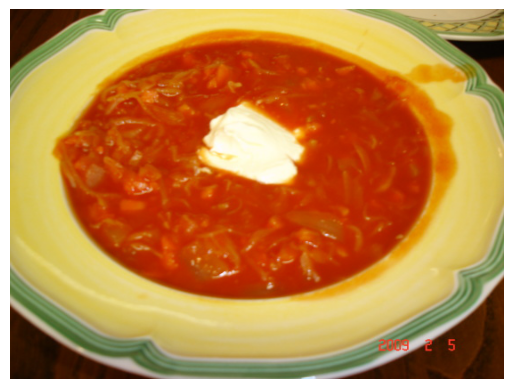

Error al cargar las imagenes

Warm Chicken A La King


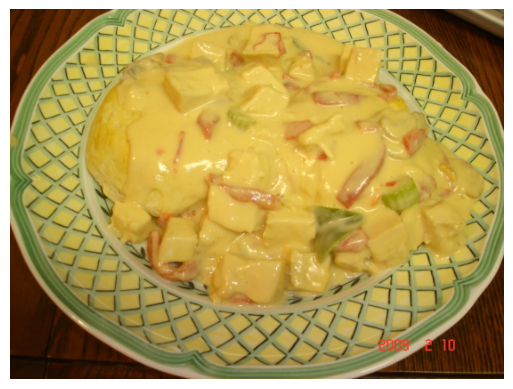

Buttermilk Pie With Gingersnap Crumb Crust


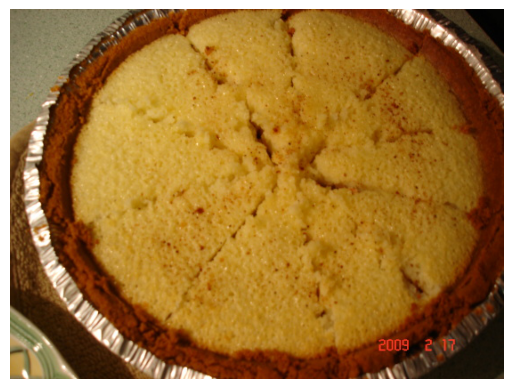

Error al cargar las imagenes

Chicken Breasts Lombardi


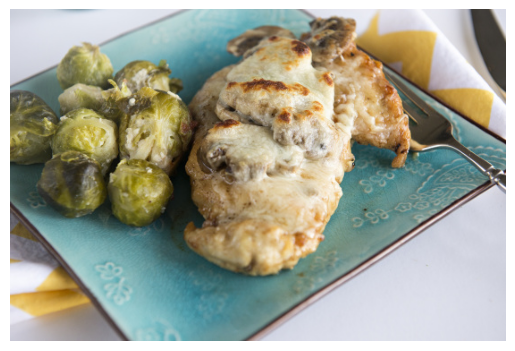

Chicken Breasts Lombardi


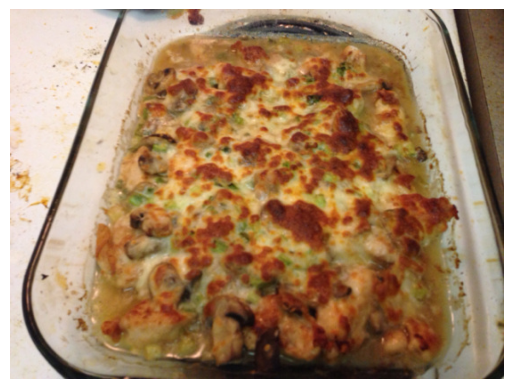

Chicken Breasts Lombardi


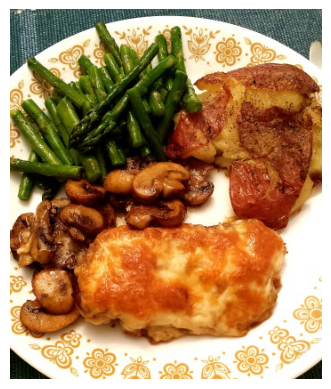

Chicken Breasts Lombardi


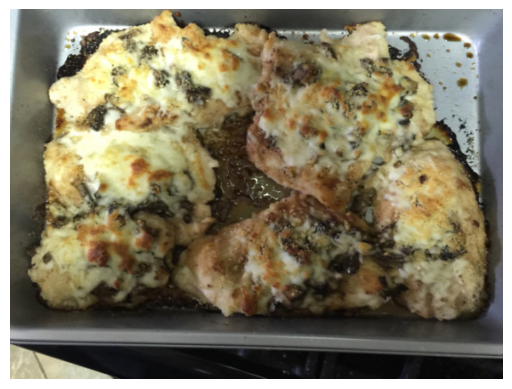

Chicken Breasts Lombardi


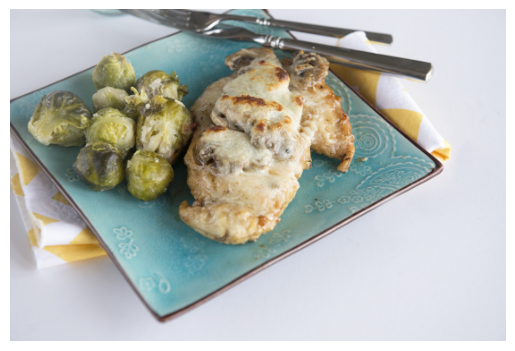

Chicken Breasts Lombardi


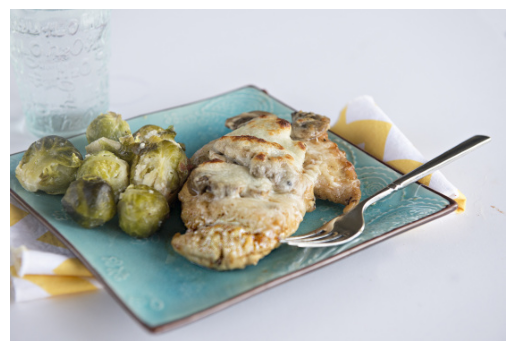

Chicken Breasts Lombardi


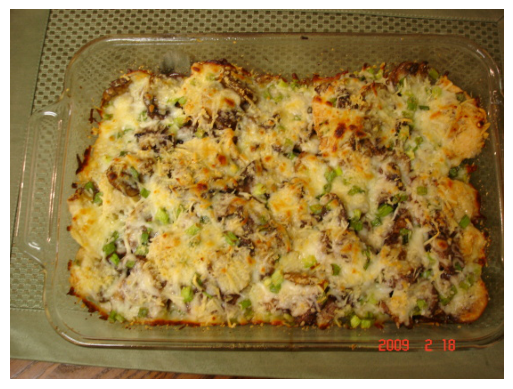

Error al cargar las imagenes

Cafe Cappuccino


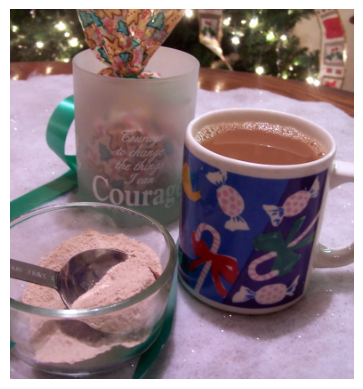

Cafe Cappuccino


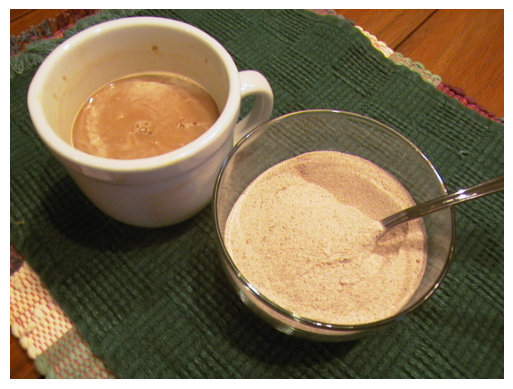

Carrot Cake


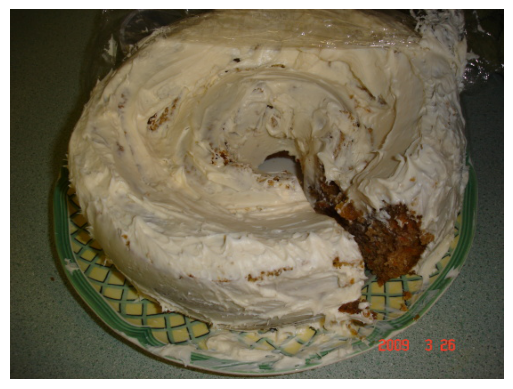

Error al cargar las imagenes



In [ ]:
# para hacerlo a todas las imagenes del dataset en un intervalo yayayaju
#print(data.columns)
#tal parece que siempre se debe corregir los links de la columna en la que estamos porque cuando se guarda en el dataset siempre hay un problema que fastidio
try:
    for i in range(100):
        links = corregir_links(data.iloc[i]['Images'])
        for link in links:
            if link == "character(0)":
                print('Error al cargar las imagenes\n')
                break
            response = requests.get(link)
            img = Image.open(BytesIO(response.content))
            # Mostrar la imagen
            plt.imshow(img)
            plt.axis('off')  # Ocultar los ejes

            #

            print(data.iloc[i]['Name'])
                       
            #

            plt.show()
except:
    print('Error al cargar las imagenes\n')
